# Capstone Project - The Battle of the Neighborhoods (Week 2)
### Applied Data Science Capstone by IBM/Coursera

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

## Introduction: Business Problem <a name="introduction"></a>

Many real estate firms have long made decisions based on a combination of intuition and traditional,
retrospective data. Today, a host of new variables make it possible to paint more vivid pictures of a 
location’s future risks and opportunities. In this report we will find the correlation between the
neighborhoods of Toronto, Canada and the nearby venues and how the venues influence the price 
of the unit.

## Data <a name="data"></a>


### Data gathering

In order to collect data on the values of the median units we must use an API.
One such is the Zoocasa API which is available for free. Then we will gather the data for the locations 
of the shops. So we will import the packages and keys for our connection to the API.

In [38]:
# Import packages
# library to handle data in a vectorized manner
import numpy as np 

# library for data analsysis
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# !conda install -c conda-forge folium=0.5.0 --yes
import folium # map rendering library

##### Insert the keys for the APIS

In [2]:
# @hidden_cell

# Import keys
CLIENT_ID = 'client-id' # your Foursquare ID
CLIENT_SECRET = 'client-secret' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

google_api_key = 'key'

#### Obtain the housing data

In [3]:
links = pd.DataFrame(columns=['link'])
links_done = 0


for page in range(1,(total_pages + 1)):

    user_agent = 'Mozilla/5.0 (Windows; U; Windows NT 5.1; en-US; rv:1.9.0.7) Gecko/2009021910 Firefox/3.0.7'
    url = "https://www.zoocasa.com/toronto-on-sold-listings?page=" + str(page)
    headers={'User-Agent':user_agent,} 

    request=urllib.request.Request(url,None,headers) #The assembled request
    data_raw = urllib.request.urlopen(request).read()
    data_split = data_raw.split(b'/listing-status>')[1:]
    time.sleep(1)

    for post in range(24): 

        try:
            start = data_split[post].find(b'href="/')
            end = data_split[post].find(b'-vow"')
            links.loc[links_done] = data_split[post][(start+7):(end+4)]

            links_done += 1
links.to_csv('house_links.csv')

In [4]:
# Prepare a table for data population

links = pd.read_csv('house_links.csv', index_col='Unnamed: 0')
data = pd.DataFrame(columns=['title','final_price', 'list_price','bedrooms','bathrooms','sqft','parking','description','mls','type','full_link','full_address', 'lat', 'long', 'city_district'])

##### Make a function to obtain the lon and lat from the adress

In [5]:
import requests

def get_coordinates(api_key, address, verbose=False):
    try:
        url = 'https://maps.googleapis.com/maps/api/geocode/json?key={}&address={}'.format(api_key, address)
        response = requests.get(url).json()
        if verbose:
            print('Google Maps API JSON result =>', response)
        results = response['results']
        geographical_data = results[0]['geometry']['location'] # get geographical coordinates
        lat = geographical_data['lat']
        lon = geographical_data['lng']
        return [lat, lon]
    except:
        return [None, None]

test = get_coordinates(google_api_key, '298 Dawlish Ave,Toronto', True)
test

Google Maps API JSON result => {'results': [{'address_components': [{'long_name': '298', 'short_name': '298', 'types': ['street_number']}, {'long_name': 'Dawlish Avenue', 'short_name': 'Dawlish Ave', 'types': ['route']}, {'long_name': 'North York', 'short_name': 'North York', 'types': ['political', 'sublocality', 'sublocality_level_1']}, {'long_name': 'Toronto', 'short_name': 'Toronto', 'types': ['locality', 'political']}, {'long_name': 'Toronto Division', 'short_name': 'Toronto Division', 'types': ['administrative_area_level_2', 'political']}, {'long_name': 'Ontario', 'short_name': 'ON', 'types': ['administrative_area_level_1', 'political']}, {'long_name': 'Canada', 'short_name': 'CA', 'types': ['country', 'political']}, {'long_name': 'M4N 1J5', 'short_name': 'M4N 1J5', 'types': ['postal_code']}], 'formatted_address': '298 Dawlish Ave, North York, ON M4N 1J5, Canada', 'geometry': {'bounds': {'northeast': {'lat': 43.7245814, 'lng': -79.3813022}, 'southwest': {'lat': 43.7244307, 'lng': 

[43.7244949, -79.3813784]

In [6]:
##### Create an excel file with the full details of the houses

In [7]:
start_time = time.time()
skipped = []
house_length = links.shape[0]

for no in range(house_length):
    try:
        url = 'https://www.zoocasa.com/' + str(links.link[no])[2:-1]

        #read data, convert to 2 formats
        request=urllib.request.Request(url,None,headers) #The assembled request
        data_raw = urllib.request.urlopen(request).read()
        soup = bs.BeautifulSoup(data_raw, 'lxml')

        #full link
        data.loc[no,'full_link'] = url

        #title
        data.loc[no,'title'] = soup.title.contents[0]

        #MLS
        mls_a = data_raw.find(b'Number</span>\n            <span>')
        mls_b = data_raw[(mls_a+32):].find(b'</span>')
        data.loc[no,'mls'] = data_raw[(mls_a+32):((mls_a+mls_b+32))]

        #Type
        type_a = data_raw.find(b'Type</span>\n            <span>')
        type_b = data_raw[(type_a+30):].find(b'</span>')
        data.loc[no,'type'] = data_raw[(type_a+30):((type_a+type_b+30))]

        #the rest
        table_html = soup.findAll("span", {"class": "blur"})
        for n,c in enumerate(['final_price', 'list_price','bedrooms','bathrooms','sqft','parking','description']):
            data.loc[no, c] = table_html[n].contents[0]

        #location data
        address = soup.title.contents[0]
        address = address.replace('Circ', 'Cir') #edit #1
        address_b = address.find('(')
        address_a = address.find('-')

        data.loc[no,'full_address'] = address[(address_a+1):address_b]

        #pause and print
        time.sleep(1)
        if no % 10 == 0: print(no, 'is done')

    except: 
        print('Problem with: ', no)
        skipped.append(no)
        continue

print('Skipped: ', skipped, ', Total: ', len(skipped))
print('Total time: %.2f' % (time.time() - start_time))

data.to_excel('data.xlsx')


#### Find the cordinates of the adresses

In [8]:
def convert_sqft(value):
    value = value.replace(' sq. ft.', '').replace('0-499', '0–499')   
    value = value.replace('–', "-")
    value = value.split("-")
    try: return (int(value[0]) + int(value[1]))/2     
    except: 0
    

In [9]:
data = pd.read_excel('data.xlsx', index_col=0)
houses_data = pd.DataFrame(columns=['Price', 'Address', 'Sqft', 'Latitude', 'Longitude'])

# Append the columns
for price, address, sqft in zip(data['final_price'], data['full_address'], data['sqft']):

    house_latlon = get_coordinates(google_api_key, address)
    house_lat = house_latlon[0]
    house_lon = house_latlon[1]

    houses_data = houses_data.append({
        'Price': price,
        'Address': address,
        'Sqft': convert_sqft(sqft),
        'Latitude': house_lat,
        'Longitude': house_lon
    }, ignore_index=True)

##### Remove the properties which the dont have a price tag or don't have cordinates

In [12]:
houses_data = pd.read_csv('house_data.csv', index_col='Unnamed: 0')
houses_data.head()

,Unnamed: 0,Price,Address,Latitude,Longitude,Sqft
0,0,855000,"38 Grenville St, Toronto",43.661896,-79.385748,850.0
1,2,550000,"30 Roehampton Ave, Toronto",43.708472,-79.397498,550.0
2,3,665000,"65 East Liberty St, Toronto",43.638399,-79.414448,650.0
3,5,368000,"4 Elsinore Path, Toronto",43.601518,-79.510062,250.0
4,6,2700000,"110 Albertus Ave, Toronto",43.714068,-79.403338,2750.0


In [16]:
print('Data shape before procedure: ', houses_data.shape)

# Drop the n/a columns
houses_data.dropna(subset=['Price'], inplace=True)
houses_data.dropna(subset=['Latitude'], inplace=True)
houses_data.dropna(subset=['Longitude'], inplace=True)

# overwriting column with replaced the unnecessary values
houses_data['Sqft'] = houses_data['Sqft'].apply(convert_sqft).round(0)
houses_data.dropna(subset=['Sqft'], inplace=True)  

# transform the columns to the right type
houses_data['Price'] = houses_data['Price'].apply(lambda b: b.replace(',', '').replace('$', '')).astype('int32')
print('Data shape after procedure: ', houses_data.shape)

Data shape before procedure:  (12137, 6)
Data shape after procedure:  (12137, 6)


In [ ]:
houses_data.to_csv('house_data.csv')

#### Obtain the number of venues near to the real estate unit

In [17]:
def get_categories(categories):
    return [(cat['name'], cat['id']) for cat in categories]

def get_venues_near_location(lat, lon, client_id, client_secret, radius=500, limit=100, verbose=False):
    version = '20180724'
    url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
        client_id, client_secret, version, lat, lon, radius, limit)
    try:
        results = requests.get(url).json()['response']['groups'][0]['items']
        if(verbose):
            print('Foursquare API JSON result =>', results)
        venues = len(results)
    except:
        venues = 0
    return venues

In [41]:
# data = pd.read_excel('house_data.csv', index_col=0)
houses_data_with_venues = pd.DataFrame(columns=['Price', 'Address', 'Sqft', 'Latitude', 'Longitude', 'Venues'])

# Append the columns
for price, address, sqft, lat, lon in zip(
        houses_data['Price'],
        houses_data['Address'],
        houses_data['Sqft'],
        houses_data['Latitude'],
        houses_data['Longitude']
):

    venues = get_venues_near_location(lat, lon, CLIENT_ID, CLIENT_SECRET)

    houses_data_with_venues = houses_data_with_venues.append({
        'Price': price,
        'Address': address,
        'Sqft': sqft,
        'Latitude': lat,
        'Longitude': lon,
        'Venues': venues
    }, ignore_index=True)

houses_data_with_venues.to_csv('houses_data_with_venues.csv')

In [40]:
houses_data_with_venues = pd.read_csv('houses_data_with_venues.csv', index_col='Unnamed: 0')

print('Data shape before procedure: ', houses_data_with_venues.shape)

# Drop the n/a columns
houses_data_with_venues.dropna(subset=['Price'], inplace=True)
houses_data_with_venues.dropna(subset=['Latitude'], inplace=True)
houses_data_with_venues.dropna(subset=['Longitude'], inplace=True)

# overwriting column with replaced the unnecessary values
houses_data_with_venues.dropna(subset=['Sqft'], inplace=True)  

# transform the columns to the right type
houses_data_with_venues['Price'] = houses_data_with_venues['Price'].apply(lambda b: b.replace(',', '')).astype('int32')
print('Data shape after procedure: ', houses_data_with_venues.shape)

Data shape before procedure:  (17292, 6)
Data shape after procedure:  (12137, 6)


In [42]:
#Map of toronto using latitude and longitude values
address = 'Toronto, Ontario'

geolocator = Nominatim(user_agent="T_On")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print("the geographical coordinate of Toronto is {}, {}".format(latitude,longitude))


#create map of toronto with boroughs data

toronto_map = folium.Map(location=[latitude, longitude], zoom_start=11)

for price, address, sqft, lat, lng, venues in zip(
        houses_data_with_venues['Price'],
        houses_data_with_venues['Address'],
        houses_data_with_venues['Sqft'],
        houses_data_with_venues['Latitude'],
        houses_data_with_venues['Longitude'],
        houses_data_with_venues['Venues'],
):
    label = "{} {} sqft ({}): {}".format(address, sqft, venues, price)
    popup = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=popup,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(toronto_map)
    
toronto_map

the geographical coordinate of Toronto is 43.6534817, -79.3839347


## Analysis <a name="analysis"></a>

To determine which features are most significant for our analysis and which values require imputing, we’ll need to construct a feature importance matrix and plot it with Matplotlib.

There are many techniques to assess feature importance, here we’ll employ a simple one: Tree Repressor.

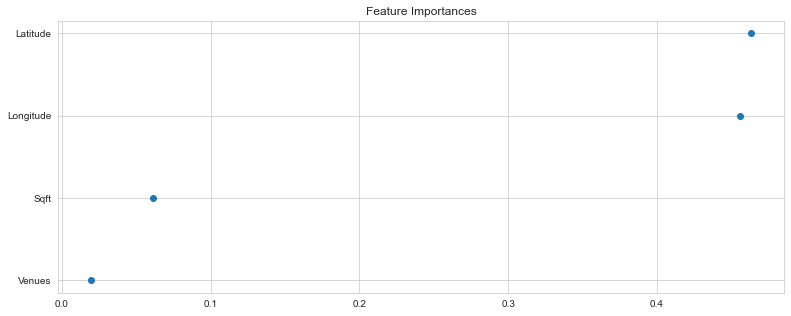

In [19]:
from sklearn.ensemble import ExtraTreesRegressor

predictors = houses_data_with_venues.drop('Price', axis=1)
predictors = predictors.drop('Address', axis=1).columns

sns.set_style("whitegrid")
plt.figure(figsize=[13,5])
model = ExtraTreesRegressor(n_estimators=10)
model.fit(houses_data_with_venues[predictors], houses_data_with_venues['Price'])
# display the relative importance of each attribute

sorted_feature_importance = sorted(zip(model.feature_importances_, houses_data_with_venues[predictors].columns))

x = [a[0] for a in sorted_feature_importance]
y = [a[1] for a in sorted_feature_importance]

plt.scatter(x,y)
plt.title('Feature Importances')
plt.show()

It appears that one of the most valuable feature is the location then sqft and the number of venues is
the last one. Let's create a correlantion heatmap to get a better visual representation.

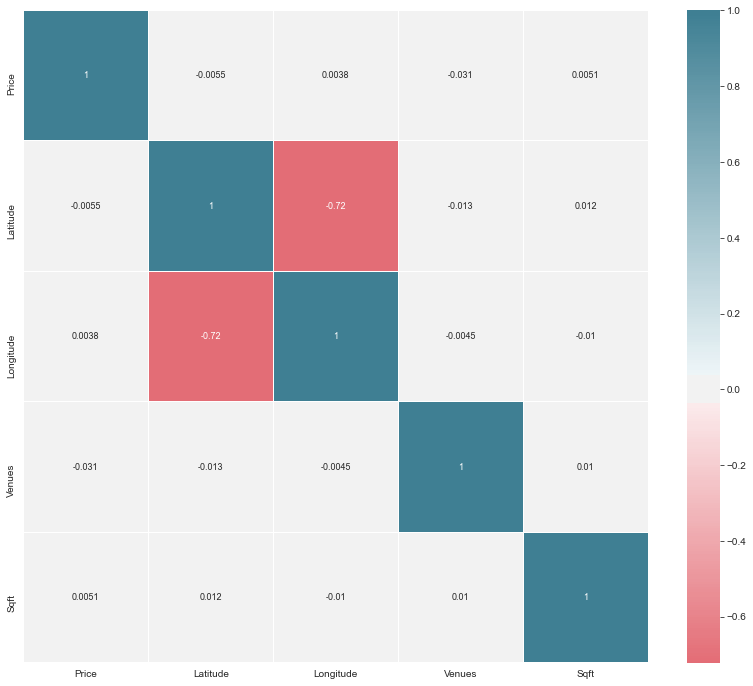

In [22]:
# Create features Heatmap to see how feature are correlated with final_price

def correlantion_heatmap(df, center = None):
    fig, ax = plt.subplots(figsize = [14,12])
    colormap = sns.diverging_palette(10, 220, as_cmap=True)
    fig = sns.heatmap(df.corr(),
                cmap = colormap,
               center = center,
                annot = True,
                linewidths = 0.1,
                annot_kws={'fontsize':9})
    
df_corr =  houses_data_with_venues.drop('Address', axis=1) 
df_corr =  df_corr.drop('Unnamed: 0', axis=1) 
correlantion_heatmap(df_corr, center=0)

Let's see if the correlation of venues and price is storng

P-value:

What is this P-value? The P-value is the probability value that the correlation between these two variables is statistically significant. Normally, we choose a significance level of 0.05, which means that we are 95% confident that the correlation between the variables is significant.

By convention, when the

p-value is  <  0.001: we say there is strong evidence that the correlation is significant.
the p-value is  <  0.05: there is moderate evidence that the correlation is significant.
the p-value is  <  0.1: there is weak evidence that the correlation is significant.
the p-value is  >  0.1: there is no evidence that the correlation is significant.

In [25]:
pearson_coef, p_value = stats.pearsonr(houses_data_with_venues['Venues'], houses_data_with_venues['Price'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P = ", p_value)  

The Pearson Correlation Coefficient is -0.031092379985254978  with a P-value of P =  0.0006128507777511565


From P-value we see that the venues play significant role at the determination of the price due to p-value is  <  0.001


From the previous section we know the good predictors of price could be:

- Sqft
- Venues

Let's develop a model using these variables as the predictor variables.
 

In [30]:
Z = houses_data_with_venues[['Sqft', 'Venues']]

Fit the linear model using the four above-mentioned variables.

In [34]:
from sklearn.preprocessing import StandardScaler, normalize, scale
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, r2_score

from sklearn.linear_model import LinearRegression
# Using LinearRegression, we can get the list of coefficient correlations between each type of venue and the average price
lreg = LinearRegression(normalize=True)

X = Z
y = houses_data_with_venues['Price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

model = lreg.fit(X_train, y_train)

In [36]:
# let's see how well Linear Regression fit the problem
y_pred = lreg.predict(X_test)

print('R2-score:', r2_score(y_test, y_pred)) # r2 score
print('Mean Squared Error:', mean_squared_error(y_test, y_pred)) # mse

print('Max positive coefs:', lreg.coef_[np.argsort(-lreg.coef_)[:10]])
print('Venue types with most postive effect:', X.columns[np.argsort(-lreg.coef_)[:10]].values)

R2-score: 0.0014273885504751949
Mean Squared Error: 406457706915.95953
Max positive coefs: [    8.21047425 -1293.44018338]
Venue types with most postive effect: ['Sqft' 'Venues']


The result doesn't look promising:
- The R2 score is small.


## Results and Discussion <a name="results"></a>

The analysis showed us that the most important role in the price of a real estate is the location.
In the sequel, the two features with the greatest influence were the square meters and in the end
the venues. Even if the venues were last, the analysis shows that there is a strong correlation
between the price and the number of stores. And then, our target group should consider this factor
when they are up to buy a real estate unit.
    

## Conclusion <a name="conclusion"></a>

The purpose of this analysis was to find out if there was a correlation between the price of
housing and the number of venues around it, in order to help the stakeholders the search for the
best location for a new property. The way I tried to support this fact was price correlation tools 
and ratios between the features.